In [66]:
# Importing libraries
!pip --quiet install scikit-learn
!pip --quiet install geopandas
!pip --quiet install xgboost
!pip --quiet install shap
!pip --quiet install statsmodels
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
import geopandas as gpd
from shapely.geometry import Point
import xgboost as xgb
from datetime import datetime
import shap
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
import os
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
os.getcwd()
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

# Data Cleaning and Preprocessing

In [ ]:
df = pd.read_csv('Crime_Data_from_2020_to_Present.csv')
df.head(5)

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,0444 0913,36,F,B,501.0,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,0416 1822 1414,25,M,H,102.0,SIDEWALK,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,1501,0,X,X,726.0,POLICE FACILITY,NaN,NaN,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),0329 1402,76,F,W,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,31,X,X,409.0,BEAUTY SUPPLY STORE,NaN,NaN,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


In [132]:
# Checking the columns in the dataframe
print(df.shape)
df.columns

(879106, 28)


Index(['DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME',
       'Rpt Dist No', 'Part 1-2', 'Crm Cd', 'Crm Cd Desc', 'Mocodes',
       'Vict Age', 'Vict Sex', 'Vict Descent', 'Premis Cd', 'Premis Desc',
       'Weapon Used Cd', 'Weapon Desc', 'Status', 'Status Desc', 'Crm Cd 1',
       'Crm Cd 2', 'Crm Cd 3', 'Crm Cd 4', 'LOCATION', 'Cross Street', 'LAT',
       'LON'],
      dtype='object')

In [133]:
# Checking the general information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 879106 entries, 0 to 879105
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DR_NO           879106 non-null  int64  
 1   Date Rptd       879106 non-null  object 
 2   DATE OCC        879106 non-null  object 
 3   TIME OCC        879106 non-null  int64  
 4   AREA            879106 non-null  int64  
 5   AREA NAME       879106 non-null  object 
 6   Rpt Dist No     879106 non-null  int64  
 7   Part 1-2        879106 non-null  int64  
 8   Crm Cd          879106 non-null  int64  
 9   Crm Cd Desc     879106 non-null  object 
 10  Mocodes         756810 non-null  object 
 11  Vict Age        879106 non-null  int64  
 12  Vict Sex        762804 non-null  object 
 13  Vict Descent    762796 non-null  object 
 14  Premis Cd       879096 non-null  float64
 15  Premis Desc     878571 non-null  object 
 16  Weapon Used Cd  305086 non-null  float64
 17  Weapon Des

In [134]:
# Descriptive analysis of the dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
DR_NO,879106.0,2.172299e+08,1.128864e+07,817.0000,2.103127e+08,2.203188e+08,2.302153e+08,2.499046e+08
TIME OCC,879106.0,1.336558e+03,6.533287e+02,1.0000,9.000000e+02,1.415000e+03,1.900000e+03,2.359000e+03
AREA,879106.0,1.070338e+01,6.099808e+00,1.0000,6.000000e+00,1.100000e+01,1.600000e+01,2.100000e+01
Rpt Dist No,879106.0,1.116778e+03,6.099855e+02,101.0000,6.150000e+02,1.141000e+03,1.615000e+03,2.199000e+03
Part 1-2,879106.0,1.411675e+00,4.921372e-01,1.0000,1.000000e+00,1.000000e+00,2.000000e+00,2.000000e+00
Crm Cd,879106.0,5.007662e+02,2.076396e+02,110.0000,3.310000e+02,4.420000e+02,6.260000e+02,9.560000e+02
Vict Age,879106.0,2.967684e+01,2.182011e+01,-3.0000,0.000000e+00,3.100000e+01,4.500000e+01,1.200000e+02
Premis Cd,879096.0,3.061888e+02,2.171074e+02,101.0000,1.010000e+02,2.030000e+02,5.010000e+02,9.760000e+02
Weapon Used Cd,305086.0,3.633108e+02,1.236991e+02,101.0000,3.100000e+02,4.000000e+02,4.000000e+02,5.160000e+02
Crm Cd 1,879095.0,5.005063e+02,2.074282e+02,110.0000,3.310000e+02,4.420000e+02,6.260000e+02,9.560000e+02


In [135]:
# Removing trailing spaces in every column
df = df.applymap(lambda x: x.strip() if isinstance(x, str) else x)

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\3880723692.py:2: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



In [136]:
# Creating a function to change the case of all string columns to title case
def title_case_columns(df):
    for column in df.select_dtypes(include=['object']).columns:
        df[column] = df[column].str.title()
    return df

# Apply the function to the DataFrame
df = title_case_columns(df)

In [137]:
print(df['Crm Cd Desc'].unique())
print(df['AREA NAME'].unique())
print(df['Premis Cd'].unique())
print(df['Vict Sex'].unique())

['Battery - Simple Assault' 'Sex Offender Registrant Out Of Compliance'
 'Vandalism - Misdeameanor ($399 Or Under)'
 'Vandalism - Felony ($400 & Over, All Church Vandalisms)'
 'Rape, Forcible' 'Shoplifting - Petty Theft ($950 & Under)'
 'Other Miscellaneous Crime'
 'Theft-Grand ($950.01 & Over)Excpt,Guns,Fowl,Livestk,Prod'
 'Burglary From Vehicle' 'Criminal Threats - No Weapon Displayed' 'Arson'
 'Theft Plain - Petty ($950 & Under)' 'Robbery'
 'Assault With Deadly Weapon, Aggravated Assault' 'Burglary'
 'Vehicle - Stolen' 'Brandish Weapon' 'Intimate Partner - Simple Assault'
 'Theft, Person' 'Battery With Sexual Contact' 'Bike - Stolen'
 'Intimate Partner - Aggravated Assault' 'Battery Police (Simple)'
 'Trespassing' 'Theft From Motor Vehicle - Petty ($950 & Under)'
 'Theft From Motor Vehicle - Attempt' 'Throwing Object At Moving Vehicle'
 'Theft Of Identity' 'Bunco, Grand Theft' 'Attempted Robbery'
 'Other Assault' 'Bomb Scare' 'Violation Of Restraining Order'
 'Sexual Penetration W/F

In [138]:
# Extracting burglary related crimes
burglary_df = df[df['Crm Cd Desc'].str.contains("Burglary", case=False, na=False)]
burglary_df

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
9,200100509,01/04/2020 12:00:00 Am,01/04/2020 12:00:00 Am,2200,1,Central,192,1,330,Burglary From Vehicle,1822 1414 0344 1307,29,M,A,101.0,Street,306.0,Rock/Thrown Object,Ic,Invest Cont,330.0,NaN,NaN,NaN,15Th,Olive,34.0359,-118.2648
21,200100559,01/23/2020 12:00:00 Am,01/23/2020 12:00:00 Am,600,1,Central,111,1,310,Burglary,1402 1822 1414 0344,51,M,W,503.0,Hotel,NaN,NaN,Ao,Adult Other,310.0,NaN,NaN,NaN,700 N Main St,NaN,34.0583,-118.2378
26,200100576,01/30/2020 12:00:00 Am,01/30/2020 12:00:00 Am,55,1,Central,195,1,330,Burglary From Vehicle,0344 1605 1611 1822 0385 0321,24,M,H,101.0,Street,NaN,NaN,Aa,Adult Arrest,330.0,NaN,NaN,NaN,18Th St,Los Angeles St,34.0317,-118.2626
39,200104035,01/01/2020 12:00:00 Am,01/01/2020 12:00:00 Am,230,1,Central,111,1,310,Burglary,0344 1822 1414 1605,34,F,B,502.0,"Multi-Unit Dwelling (Apartment, Duplex, Etc)",NaN,NaN,Ic,Invest Cont,310.0,NaN,NaN,NaN,700 Yale St,NaN,34.0612,-118.2417
56,200104069,01/02/2020 12:00:00 Am,01/02/2020 12:00:00 Am,545,1,Central,111,1,310,Burglary,1822 1414 0344 1609,0,X,X,210.0,Restaurant/Fast Food,500.0,Unknown Weapon/Other Weapon,Ic,Invest Cont,310.0,NaN,NaN,NaN,800 N Broadway,NaN,34.0623,-118.2383
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
879065,240204642,01/13/2024 12:00:00 Am,01/10/2024 12:00:00 Am,1800,2,Rampart,238,1,310,Burglary,1607 0344,71,F,H,501.0,Single Family Dwelling,NaN,NaN,Ic,Invest Cont,310.0,NaN,NaN,NaN,1300 Colton St,NaN,34.0630,-118.2566
879067,240904121,01/04/2024 12:00:00 Am,01/03/2024 12:00:00 Am,2046,9,Van Nuys,946,1,310,Burglary,0344 1609 0358 0321 1420 1414,33,M,W,501.0,Single Family Dwelling,NaN,NaN,Ic,Invest Cont,310.0,NaN,NaN,NaN,5500 Mammoth Av,NaN,34.1703,-118.4323
879078,240204648,01/14/2024 12:00:00 Am,01/13/2024 12:00:00 Am,637,2,Rampart,205,1,330,Burglary From Vehicle,1300 1822 0344 1609 1307 0329,39,M,W,101.0,Street,NaN,NaN,Ic,Invest Cont,330.0,NaN,NaN,NaN,Marathon,Parkman,34.0807,-118.2753
879082,241704452,01/10/2024 12:00:00 Am,01/10/2024 12:00:00 Am,1020,17,Devonshire,1776,1,330,Burglary From Vehicle,0344 1202,60,M,W,501.0,Single Family Dwelling,NaN,NaN,Ic,Invest Cont,330.0,NaN,NaN,NaN,9500 Gerald Av,NaN,34.2430,-118.4949


- The main focus of this project is to analyse burglary-related crimes in the city of Los Angeles. The code above was used to extract all burglary-related crimes, and from this, I hope to gain meaningful insights into this type of crime in LA.

In [139]:
# Viewing all the unique burglary-related in the dataframe
print(burglary_df['Crm Cd Desc'].unique())

['Burglary From Vehicle' 'Burglary' 'Burglary, Attempted'
 'Burglary From Vehicle, Attempted']


In [140]:
print(burglary_df['AREA NAME'].unique())
print(burglary_df['Premis Cd'].unique())
print(burglary_df['Vict Sex'].unique())

['Central' 'Harbor' 'Hollenbeck' 'Rampart' 'Southwest' 'Newton' 'Mission'
 'Wilshire' 'Hollywood' 'West La' 'Van Nuys' 'Olympic' 'Devonshire'
 'Pacific' 'Northeast' 'N Hollywood' 'Topanga' 'West Valley' '77Th Street'
 'Foothill' 'Southeast']
[101. 503. 502. 210. 707. 516. 108. 123. 741. 719. 504. 103. 102. 404.
 152. 212. 705. 727. 218. 501. 221. 203. 406. 722. 702. 118. 201. 113.
 122. 733. 506. 708. 403. 216. 401. 710. 402. 220. 514. 231. 120. 301.
 121. 104. 721. 704. 213. 222. 254. 229. 411. 248. 109. 725. 116. 897.
 505. 211. 255. 151. 412. 754. 738. 723. 405. 408. 251. 509. 967. 602.
 515. 207. 202. 243. 239. 508. 720. 217. 729. 232. 730. 107. 744. 410.
 205. 209. 507. 701. 236. 717. 219. 518. 242. 244. 249. 252. 418. 140.
 150. 230. 143. 145. 834. 809. 225. 247. 735. 742. 141. 124. 931. 716.
 142. 726. 302. 147. 409. 253. 233. 510. 407. 413. 728. 703. 724. 128.
 417. 519. 157. 755. 706. 144. 206. 415. 117. 204. 414. 119. 416. 237.
 235. 224. 752. 718. 112. 256. 743. 511. 208. 30

In [141]:
# Counting the occurrences of each value in the "Crm Cd Desc" column
crime_cd_desc_counts = burglary_df['Crm Cd Desc'].value_counts()
occurrences_df = pd.DataFrame({'Crm Cd Desc': crime_cd_desc_counts.index, 'Occurrences': crime_cd_desc_counts.values})
occurrences_df

,Crm Cd Desc,Occurrences
0,Burglary From Vehicle,54245
1,Burglary,53762
2,"Burglary, Attempted",3690
3,"Burglary From Vehicle, Attempted",645


In [142]:
# Converting date columns to datetime format
burglary_df['Date Rptd'] = pd.to_datetime(burglary_df['Date Rptd'])
burglary_df['DATE OCC'] = pd.to_datetime(burglary_df['DATE OCC'])

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\2588301835.py:2: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\2588301835.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\2588301835.py:3: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\2588301835.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a s

In [143]:
# Converting 'TIME OCC' to a string format and pad with leading zeros in case
burglary_df['TIME OCC'] = burglary_df['TIME OCC'].astype(str).str.zfill(4)

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\1098639536.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [144]:
# Combining 'DATE OCC' and 'TIME OCC' into a single datetime column
burglary_df['Datetime OCC'] = pd.to_datetime(burglary_df['DATE OCC'].astype(str) + ' ' + burglary_df['TIME OCC'].astype(str), format='%Y-%m-%d %H%M')

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\1910041159.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [145]:
# Extracting additional temporal features
burglary_df['Day of Week'] = burglary_df['Datetime OCC'].dt.dayofweek
burglary_df['Month'] = burglary_df['Datetime OCC'].dt.month
burglary_df['Hour'] = burglary_df['Datetime OCC'].dt.hour
burglary_df['Year'] = burglary_df['DATE OCC'].dt.year

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\4078568996.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\4078568996.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\4078568996.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

In [146]:
# Displaying the dataframe
burglary_df

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Datetime OCC,Day of Week,Month,Hour,Year
9,200100509,2020-01-04,2020-01-04,2200,1,Central,192,1,330,Burglary From Vehicle,1822 1414 0344 1307,29,M,A,101.0,Street,306.0,Rock/Thrown Object,Ic,Invest Cont,330.0,NaN,NaN,NaN,15Th,Olive,34.0359,-118.2648,2020-01-04 22:00:00,5,1,22,2020
21,200100559,2020-01-23,2020-01-23,0600,1,Central,111,1,310,Burglary,1402 1822 1414 0344,51,M,W,503.0,Hotel,NaN,NaN,Ao,Adult Other,310.0,NaN,NaN,NaN,700 N Main St,NaN,34.0583,-118.2378,2020-01-23 06:00:00,3,1,6,2020
26,200100576,2020-01-30,2020-01-30,0055,1,Central,195,1,330,Burglary From Vehicle,0344 1605 1611 1822 0385 0321,24,M,H,101.0,Street,NaN,NaN,Aa,Adult Arrest,330.0,NaN,NaN,NaN,18Th St,Los Angeles St,34.0317,-118.2626,2020-01-30 00:55:00,3,1,0,2020
39,200104035,2020-01-01,2020-01-01,0230,1,Central,111,1,310,Burglary,0344 1822 1414 1605,34,F,B,502.0,"Multi-Unit Dwelling (Apartment, Duplex, Etc)",NaN,NaN,Ic,Invest Cont,310.0,NaN,NaN,NaN,700 Yale St,NaN,34.0612,-118.2417,2020-01-01 02:30:00,2,1,2,2020
56,200104069,2020-01-02,2020-01-02,0545,1,Central,111,1,310,Burglary,1822 1414 0344 1609,0,X,X,210.0,Restaurant/Fast Food,500.0,Unknown Weapon/Other Weapon,Ic,Invest Cont,310.0,NaN,NaN,NaN,800 N Broadway,NaN,34.0623,-118.2383,2020-01-02 05:45:00,3,1,5,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
879065,240204642,2024-01-13,2024-01-10,1800,2,Rampart,238,1,310,Burglary,1607 0344,71,F,H,501.0,Single Family Dwelling,NaN,NaN,Ic,Invest Cont,310.0,NaN,NaN,NaN,1300 Colton St,NaN,34.0630,-118.2566,2024-01-10 18:00:00,2,1,18,2024
879067,240904121,2024-01-04,2024-01-03,2046,9,Van Nuys,946,1,310,Burglary,0344 1609 0358 0321 1420 1414,33,M,W,501.0,Single Family Dwelling,NaN,NaN,Ic,Invest Cont,310.0,NaN,NaN,NaN,5500 Mammoth Av,NaN,34.1703,-118.4323,2024-01-03 20:46:00,2,1,20,2024
879078,240204648,2024-01-14,2024-01-13,0637,2,Rampart,205,1,330,Burglary From Vehicle,1300 1822 0344 1609 1307 0329,39,M,W,101.0,Street,NaN,NaN,Ic,Invest Cont,330.0,NaN,NaN,NaN,Marathon,Parkman,34.0807,-118.2753,2024-01-13 06:37:00,5,1,6,2024
879082,241704452,2024-01-10,2024-01-10,1020,17,Devonshire,1776,1,330,Burglary From Vehicle,0344 1202,60,M,W,501.0,Single Family Dwelling,NaN,NaN,Ic,Invest Cont,330.0,NaN,NaN,NaN,9500 Gerald Av,NaN,34.2430,-118.4949,2024-01-10 10:20:00,2,1,10,2024


In [147]:
# Counting the occurrences of each value in the "Weapon Desc" column
burglary_df_Weapon_counts = burglary_df['Weapon Desc'].value_counts()
burg_with_weapon = pd.DataFrame({'Weapon Desc': burglary_df_Weapon_counts.index, 'Occurrences': burglary_df_Weapon_counts.values})
burg_with_weapon

,Weapon Desc,Occurrences
0,Unknown Weapon/Other Weapon,8233
1,"Strong-Arm (Hands, Fist, Feet Or Bodily Force)",1217
2,Rock/Thrown Object,210
3,Hammer,130
4,Unknown Type Cutting Instrument,114
5,Other Cutting Instrument,113
6,Screwdriver,83
7,Concrete Block/Brick,76
8,Pipe/Metal Pipe,70
9,Blunt Instrument,49


It is evident that the weapons used in burglary-related crimes were not documented in 101788 out of 112342 cases, resulting in a total of 10554 weapons being recorded. Additionally, out of the 10554 weapons recorded, 8233 instances indicated that the weapons were unknown.

# Dropping Columns

## The following columns columns will dropped from the dataframe including the reason dropping the column:

- Weapon Used Cd:- Most of the columns are missing and unknown
- Weapon Desc:- Same as Weapon Used Cd
- Crm Cd 1:- Same column as Crm Cd
- Crm Cd 2:- To many missing values
- Crm Cd 3:- To many missing values
- Crm Cd 4:- To many missing values
- Cross Street:- To many missing values

In [148]:
columns_to_drop = ['Weapon Used Cd', 'Weapon Desc', 'Crm Cd 1', 'Crm Cd 2', 'Crm Cd 3', 'Crm Cd 4', 'Cross Street']
burglary_df.drop(columns=columns_to_drop, inplace=True)

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\1437995002.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [149]:
# Checking for missing values in Premis Desc column
missing_values = burglary_df[burglary_df['Premis Desc'].isna()]
missing_values

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Status,Status Desc,LOCATION,LAT,LON,Datetime OCC,Day of Week,Month,Hour,Year
14224,200510143,2020-05-31,2020-05-31,2100,5,Harbor,529,1,320,"Burglary, Attempted",0216 0329 0342 1236 1309 1609,0,X,X,418.0,NaN,Ic,Invest Cont,200 E Anaheim St,33.7801,-118.2611,2020-05-31 21:00:00,6,5,21,2020
18957,200400831,2020-05-30,2020-05-30,2330,4,Hollenbeck,499,1,310,Burglary,1402 0344 0321,0,X,X,418.0,NaN,Ja,Juv Arrest,3600 E Olympic Bl,34.0188,-118.2010,2020-05-30 23:30:00,5,5,23,2020
23072,200113441,2020-06-15,2020-05-30,2148,1,Central,163,1,310,Burglary,0329 0344 2018 1607 0321 1822,37,M,W,418.0,NaN,Ic,Invest Cont,700 S Broadway,34.0452,-118.2534,2020-05-30 21:48:00,5,5,21,2020
25424,200405047,2020-01-28,2020-01-28,0258,4,Hollenbeck,499,1,310,Burglary,2053 0903 1822 1528 1402 1607,0,M,W,418.0,NaN,Ao,Adult Other,3500 E Pico Bl,34.0180,-118.2028,2020-01-28 02:58:00,1,1,2,2020
27903,200510139,2020-05-31,2020-05-31,2050,5,Harbor,529,1,320,"Burglary, Attempted",2018 0216 0329 0342 1309 1402 1609 1236 0207,0,X,X,418.0,NaN,Ic,Invest Cont,800 E Anaheim St,33.7805,-118.2533,2020-05-31 20:50:00,6,5,20,2020
47749,200611292,2020-06-10,2020-05-30,2225,6,Hollywood,663,1,310,Burglary,1601 1607 0329 0344 2018,0,X,X,418.0,NaN,Ic,Invest Cont,7000 Santa Monica Bl,34.0907,-118.3416,2020-05-30 22:25:00,5,5,22,2020
63789,200710305,2020-06-11,2020-05-30,1900,7,Wilshire,702,1,310,Burglary,0321 1822 1607 0325 0344,52,M,O,418.0,NaN,Ic,Invest Cont,7500 W Melrose Av,34.0837,-118.3532,2020-05-30 19:00:00,5,5,19,2020
64232,200709819,2020-05-31,2020-05-29,1500,7,Wilshire,782,1,310,Burglary,1402 0344 1609,53,M,B,418.0,NaN,Ic,Invest Cont,6000 Cadillac Av,34.0375,-118.3742,2020-05-29 15:00:00,4,5,15,2020
65789,200710622,2020-06-17,2020-05-30,1800,7,Wilshire,701,1,310,Burglary,2018 1609 0344 0325 0321 0601,26,F,W,418.0,NaN,Ic,Invest Cont,8100 W Melrose Av,34.0838,-118.3659,2020-05-30 18:00:00,5,5,18,2020
72904,200900942,2020-12-13,2020-12-13,0710,9,Van Nuys,943,1,310,Burglary,1607 0344 1402 0216 0209 0321 0358 1420,32,M,W,256.0,NaN,Ic,Invest Cont,6000 Tyrone Av,34.1794,-118.4443,2020-12-13 07:10:00,6,12,7,2020


In [150]:
# Defining the columns to check for duplicates
columns_to_check = [
    'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME', 
    'Rpt Dist No', 'Part 1-2', 'Crm Cd', 'Crm Cd Desc', 'Mocodes', 
    'Vict Age', 'Vict Sex', 'Vict Descent', 'Premis Cd', 'LAT', 'LON'
]

# Identifying the duplicate rows based on the specified columns
duplicates = burglary_df[burglary_df.duplicated(subset=columns_to_check, keep=False)]

# Dropping the non-duplicate rows to get the unique duplicates
unique_duplicates = duplicates.drop_duplicates(subset=columns_to_check)

# Counting the number of unique duplicate records
num_unique_duplicates = unique_duplicates.shape[0]

print("Total number of unique duplicate records:", num_unique_duplicates)

Total number of unique duplicate records: 71


In [151]:
# Checking for duplicate values in the dataframe
# Defining the columns to check for duplicates
columns_to_check = [
    'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME', 
    'Rpt Dist No', 'Part 1-2', 'Crm Cd', 'Crm Cd Desc', 'Mocodes', 
    'Vict Age', 'Vict Sex', 'Vict Descent', 'Premis Cd', 'LAT', 'LON'
]

# Dropping duplicate rows based on the specified columns
burglary_df1 = burglary_df.drop_duplicates(subset=columns_to_check, keep='first')

# Checking for missing values in the dataset
print(burglary_df1.isna().sum())

DR_NO             0
Date Rptd         0
DATE OCC          0
TIME OCC          0
AREA              0
AREA NAME         0
Rpt Dist No       0
Part 1-2          0
Crm Cd            0
Crm Cd Desc       0
Mocodes         340
Vict Age          0
Vict Sex         93
Vict Descent     92
Premis Cd         0
Premis Desc     316
Status            0
Status Desc       0
LOCATION          0
LAT               0
LON               0
Datetime OCC      0
Day of Week       0
Month             0
Hour              0
Year              0
dtype: int64


The code above was used to identify duplicate records from the selected dataframe. It was observed that there are 71 duplicate records. I further went on to drop these duplicate records with the next code.

## Data Categorisation
Here I will categorise some columns in the dataframe into various categories. Example will include;
- Months will be categorised into seasons in the year.
- Hours will be categorised into periods of the day.

e.t.c

In [152]:
# Defining times of the day based on the hours
hour_categories = {
    'Late Night (Midnight - 6 AM)': [0, 1, 2, 3, 4, 5],
    'Morning (6 AM - Noon)': [6, 7, 8, 9, 10, 11],
    'Afternoon (Noon - 6 PM)': [12, 13, 14, 15, 16, 17],
    'Evening (6 PM - Midnight)': [18, 19, 20, 21, 22, 23]
}

# Function to categorise hours
def categorize_hour(hour):
    for category, hours in hour_categories.items():
        if hour in hours:
            return category
    return 'Other'

# Applying categorisation to the dataframe
burglary_df1['Hour Category'] = burglary_df1['Hour'].apply(categorize_hour)

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\553686132.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [153]:
# Defining month categories
month_categories = {
    'Spring': [3, 4, 5],
    'Summer': [6, 7, 8],
    'Fall (Autumn)': [9, 10, 11],
    'Winter': [12, 1, 2]
}

# Creating a function to categorise months
def categorize_month(month):
    for category, months in month_categories.items():
        if month in months:
            return category
    return 'Other'

# Applying categorisation to the dataframe
burglary_df1['Month Category'] = burglary_df1['Month'].apply(categorize_month)

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\1031885512.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [154]:
# Defining the day of week categories
day_categories = {
    'Weekday': [0, 1, 2, 3, 4],
    'Weekend': [5, 6]
}

# Creating a function to categorise days of the week
def categorize_day(day):
    for category, days in day_categories.items():
        if day in days:
            return category
    return 'Other'

# Applying categorisation to the DataFrame
burglary_df1['Day Category'] = burglary_df1['Day of Week'].apply(categorize_day)

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\121848628.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [155]:
# Checking for negative and invalid ages in 'Vict Age' column
invalid_ages = burglary_df1[(burglary_df1['Vict Age'] < 0) | (burglary_df1['Vict Age'] > 120)]

# Getting the count of invalid ages
count_invalid_ages = invalid_ages.shape[0]

# Displaying the count of invalid ages
print("Count of Invalid Ages: ", count_invalid_ages)

Count of Invalid Ages:  6


In [156]:
# Calculating the mean of the valid ages
mean_valid_age = burglary_df1[burglary_df1['Vict Age'] >= 0]['Vict Age'].mean()

# Converting the mean age to integer
mean_valid_age = int(mean_valid_age)

# Displaying the mean valid age
print(mean_valid_age)

# Replacing the invalid ages with the calculated mean using boolean indexing and loc
burglary_df1.loc[burglary_df1['Vict Age'] < 0, 'Vict Age'] = mean_valid_age

34


In [157]:
# Checking for negative and invalid ages in 'Vict Age' column
invalid_ages2 = burglary_df1[(burglary_df1['Vict Age'] < 0) | (burglary_df1['Vict Age'] > 120)]

# Getting the count of invalid ages
count_invalid_ages2 = invalid_ages2.shape[0]

# Displaying the count of invalid ages
print("Count of Invalid Ages: ", count_invalid_ages2)

Count of Invalid Ages:  0


# Data Visualization
During this stage, data will also be cleaned and transformated.

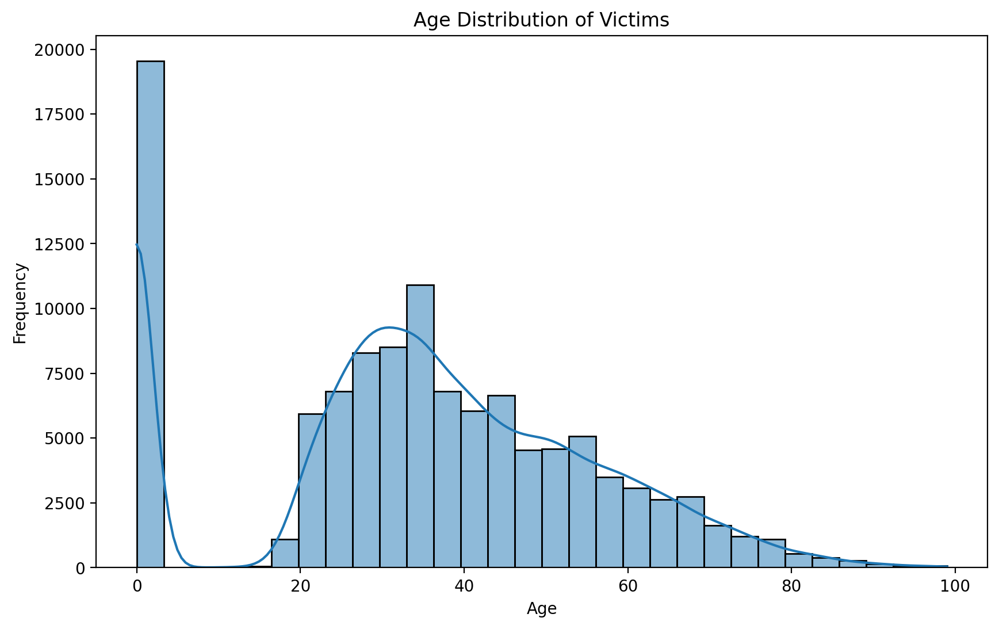

In [158]:
# Plotting the victim age distribution
plt.figure(figsize=(10, 6))
sns.histplot(burglary_df1['Vict Age'], bins=30, kde=True)
plt.title('Age Distribution of Victims')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

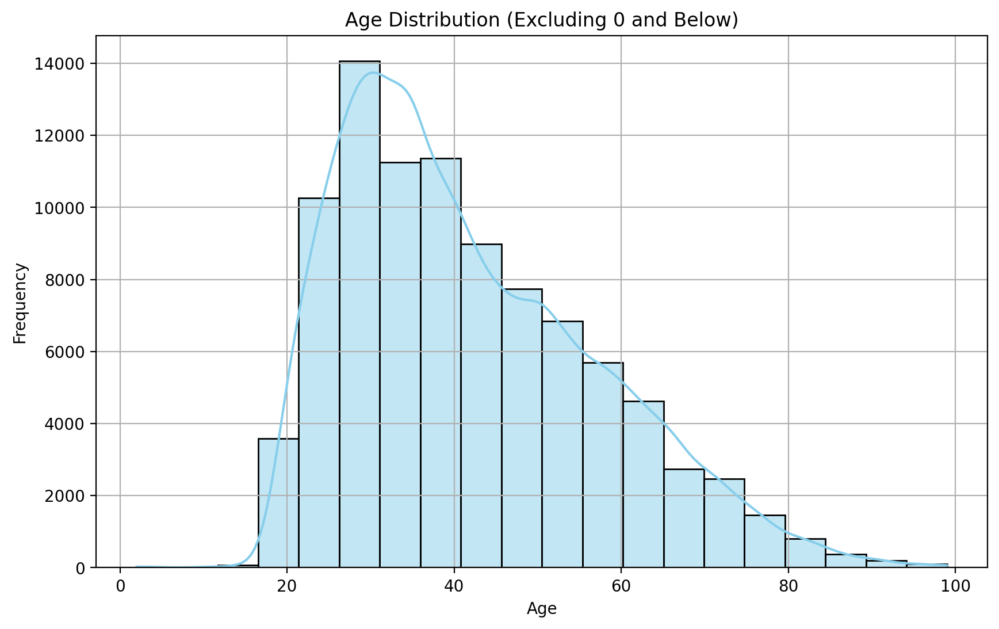

In [159]:
# Dropping rows where 'Vict Age' is missing or less than or equal to 0
df_age_filtered = burglary_df1.dropna(subset=['Vict Age'])
df_age_filtered = df_age_filtered[df_age_filtered['Vict Age'] > 0]

# Plotting the age distribution
plt.figure(figsize=(10, 6))
sns.histplot(df_age_filtered['Vict Age'], bins=20, kde=True, color='skyblue')
plt.title('Age Distribution (Excluding 0 and Below)')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [160]:
# Calculating the mean age before excluding ages 0 and below
mean_age_before = burglary_df1['Vict Age'].mean()

# Dropping rows where the victim age is missing or less than or equal to 0
df_age_filtered = burglary_df1.dropna(subset=['Vict Age'])
df_age_filtered = burglary_df1[df_age_filtered['Vict Age'] > 0]

# Calculating the mean age after excluding ages 0 and below
mean_age_after = df_age_filtered['Vict Age'].mean()

# Displaying the results
print(f"Mean age before excluding 0 and below: {mean_age_before}")
print(f"Mean age after excluding 0 and below: {mean_age_after}")

Mean age before excluding 0 and below: 34.571748179443986
Mean age after excluding 0 and below: 41.8529560929289


In [161]:
# Finding the highest occurring Vict Age before excluding ages 0 and below
highest_occurrence_before = burglary_df1['Vict Age'].mode().iloc[0]
occurrence_count_before = (burglary_df1['Vict Age'] == highest_occurrence_before).sum()

# Dropping rows where 'Vict Age' is missing or less than or equal to 0
df_age_filtered = burglary_df1.dropna(subset=['Vict Age'])
df_age_filtered = df_age_filtered[df_age_filtered['Vict Age'] > 0]

# Finding the highest occurring Vict Age after excluding ages 0 and below
highest_occurrence_after = df_age_filtered['Vict Age'].mode().iloc[0]
occurrence_count_after = (df_age_filtered['Vict Age'] == highest_occurrence_after).sum()

# Displaying the results
print(f"Highest occurring Vict Age before excluding 0 and below: {highest_occurrence_before}")
print(f"Number of times highest occurring Vict Age occurs before excluding 0 and below: {occurrence_count_before}")
print(f"Highest occurring Vict Age after excluding 0 and below: {highest_occurrence_after}")
print(f"Number of times highest occurring Vict Age occurs after excluding 0 and below: {occurrence_count_after}")

Highest occurring Vict Age before excluding 0 and below: 0
Number of times highest occurring Vict Age occurs before excluding 0 and below: 19518
Highest occurring Vict Age after excluding 0 and below: 35
Number of times highest occurring Vict Age occurs after excluding 0 and below: 3049


In [162]:
# Calculating the ratio of various victim sexes
sex_ratio = burglary_df1['Vict Sex'].value_counts(normalize=True)

# Displaying the ratios
print("Ratio of various victim sexes:")
print(sex_ratio)

Ratio of various victim sexes:
Vict Sex
M    0.524907
F    0.346875
X    0.128058
H    0.000161
Name: proportion, dtype: float64


In [163]:
# Defining the desired ratio
desired_ratio = {'M': 2/3, 'F': 1/3}

# Counting the number of missing values
missing_count = burglary_df1['Vict Sex'].isna().sum()

# Calculating the number of Males and Females to fill
num_males = int(missing_count * desired_ratio['M'])
num_females = int(missing_count * desired_ratio['F'])

# Filling in missing values with Males and Females based on the ratio
burglary_df1['Vict Sex'] = burglary_df1['Vict Sex'].fillna(value='M', limit=num_males)
burglary_df1['Vict Sex'] = burglary_df1['Vict Sex'].fillna(value='F', limit=num_females)


C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\1938161656.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\1938161656.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [164]:
# Calculating the ratio of various victim sexes
sex_ratio = burglary_df1['Vict Descent'].value_counts(normalize=True)

# Displaying the ratios
print("Ratio of various victim Descent:")
print(sex_ratio)

Ratio of various victim Descent:
Vict Descent
W    0.314017
H    0.227790
X    0.139796
O    0.130206
B    0.115086
A    0.041401
K    0.009688
F    0.007556
C    0.006905
J    0.002248
V    0.001882
I    0.001347
Z    0.000865
P    0.000517
U    0.000241
D    0.000161
G    0.000107
S    0.000098
L    0.000089
Name: proportion, dtype: float64


In [165]:
# Defining the existing ratio of various victim descents
existing_ratio = {
    'W': 0.314017,
    'H': 0.227790,
    'X': 0.139796,
    'O': 0.130206,
    'B': 0.115086,
    'A': 0.041401,
    'K': 0.009688,
    'F': 0.007556,
    'C': 0.006905,
    'J': 0.002248,
    'V': 0.001882,
    'I': 0.001347,
    'Z': 0.000865,
    'P': 0.000517,
    'U': 0.000241,
    'D': 0.000161,
    'G': 0.000107,
    'S': 0.000098,
    'L': 0.000089
}

# Counting the number of missing values
missing_count = burglary_df1['Vict Descent'].isna().sum()

# Calculating the number of values to fill for each category based on the existing ratio
fill_counts = {category: int(existing_ratio[category] * missing_count) for category in existing_ratio}

# Fill missing values with categories based on the existing ratio
for category, count in fill_counts.items():
    burglary_df1.loc[burglary_df1['Vict Descent'].isna(), 'Vict Descent'] = category


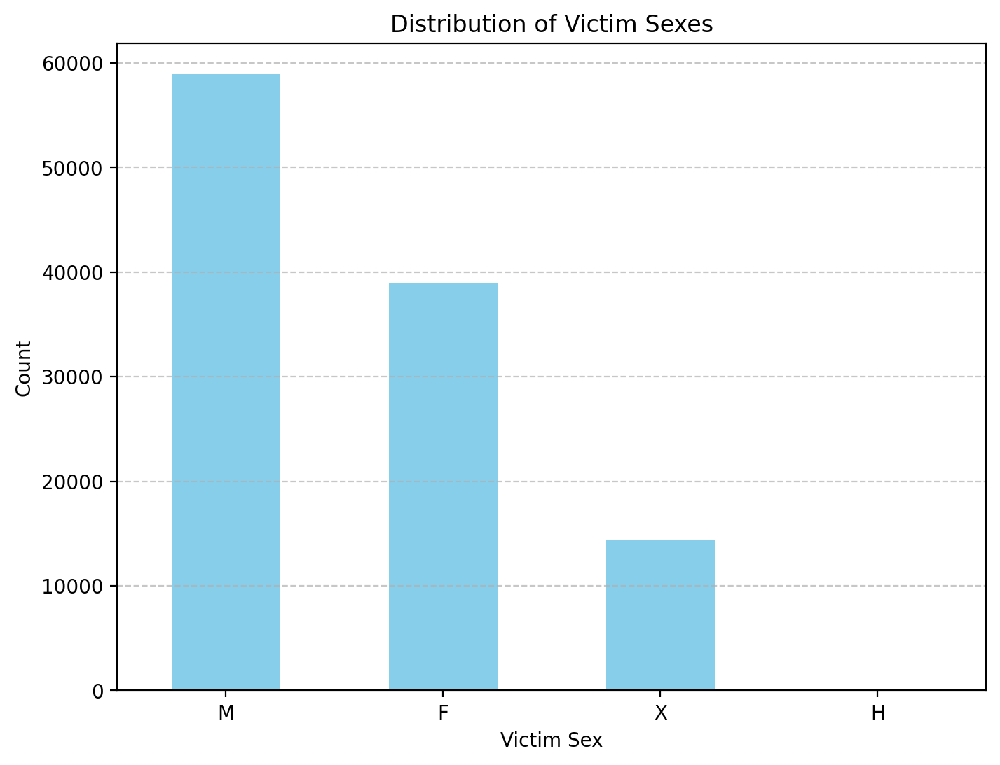

In [166]:
# Counting the occurrences of each victim sex
victim_sex_counts = burglary_df1['Vict Sex'].value_counts()

# Ploting the distribution of victim sexes
plt.figure(figsize=(8, 6))
victim_sex_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Victim Sexes')
plt.xlabel('Victim Sex')
plt.ylabel('Count')
plt.xticks(rotation=0)  # Rotate x-axis labels if necessary
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

<Figure size 2000x1000 with 0 Axes>

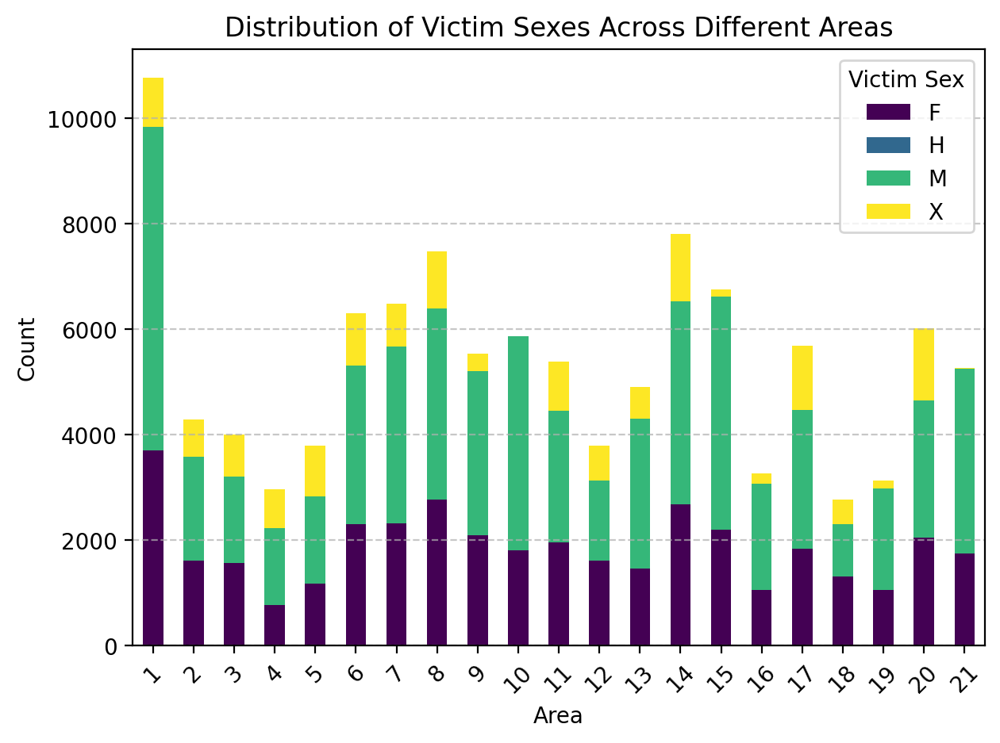

In [167]:
# Grouping the data by 'AREA' and 'Vict Sex', and count occurrences
sex_by_area = burglary_df1.groupby(['AREA', 'Vict Sex']).size().unstack(fill_value=0)

# Plotting the distribution of victim sexes for each area
plt.figure(figsize=(20, 10))
sex_by_area.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Distribution of Victim Sexes Across Different Areas')
plt.xlabel('Area')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='Victim Sex', loc='upper right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [168]:
sex_by_area

Vict Sex,F,H,M,X
AREA,,,,
1,3693,0,6147,937
2,1609,0,1972,696
3,1560,0,1642,795
4,765,1,1462,737
5,1164,0,1665,953
6,2295,0,3009,1000
7,2312,1,3360,801
8,2767,0,3631,1082
9,2081,1,3117,334


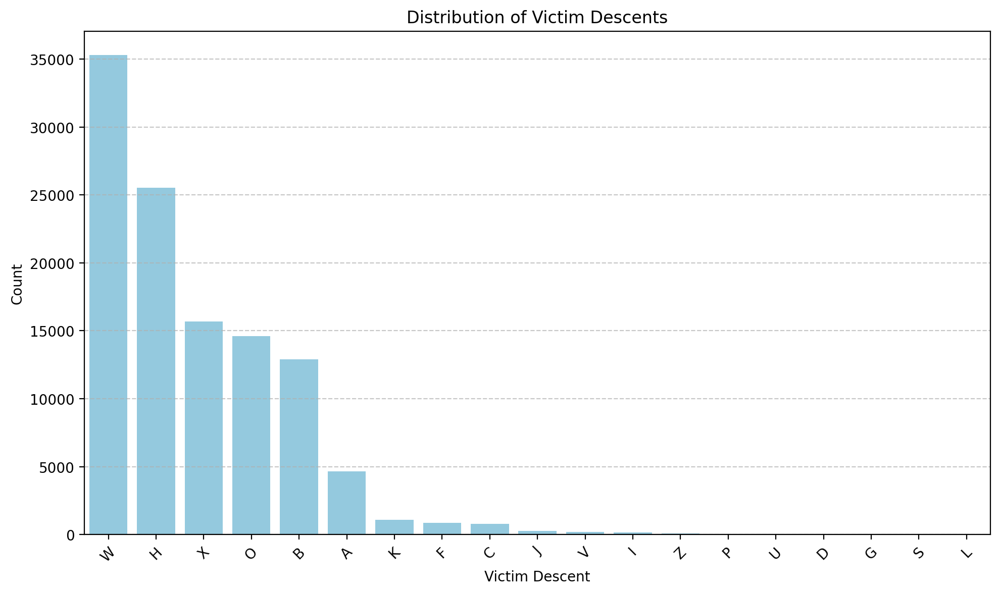

In [169]:
# Counting the occurrences of each victim descent
victim_descent_counts = burglary_df1['Vict Descent'].value_counts()

# Plotting the distribution of victim descents
plt.figure(figsize=(10, 6))
sns.barplot(x=victim_descent_counts.index, y=victim_descent_counts.values, color='skyblue')
plt.title('Distribution of Victim Descents')
plt.xlabel('Victim Descent')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

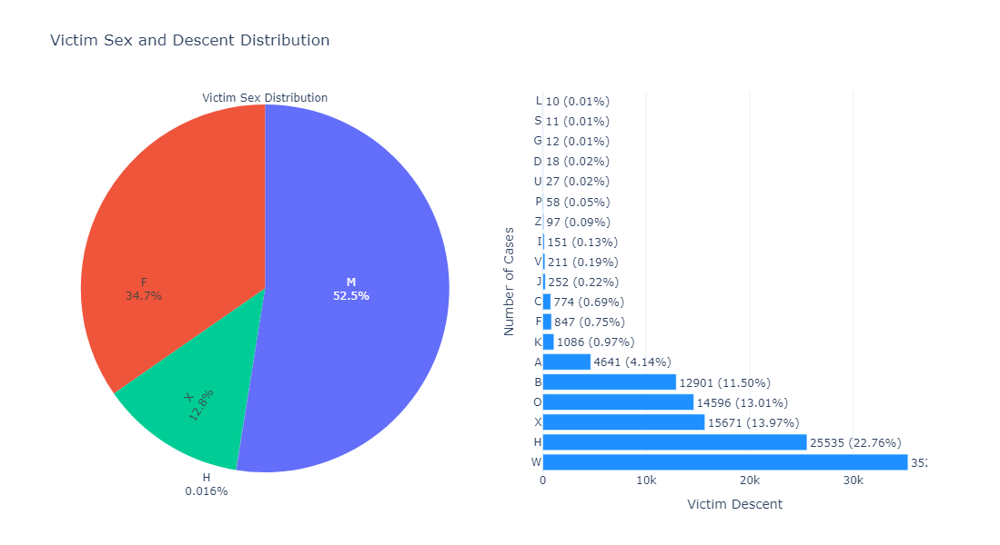

In [170]:
# Data for ploting
victim_sex_data = burglary_df1['Vict Sex'].value_counts()
victim_descent_data = burglary_df1['Vict Descent'].value_counts()
total_cases = victim_descent_data.sum()

# Creating subplots: 1 row, 2 columns
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"}, {"type": "bar"}]])

# Pie plot for victim_sex
fig.add_trace(
    go.Pie(
        labels=victim_sex_data.index, 
        values=victim_sex_data, 
        title="Victim Sex Distribution",
        textinfo='label+percent',  
        insidetextorientation='radial'  
    ), 
    row=1, col=1
)

# Horizontal bar chart for victim_descent
fig.add_trace(
    go.Bar(
        x=victim_descent_data.values, 
        y=victim_descent_data.index, 
        orientation='h', 
        marker_color='dodgerblue',
        text=[f"{count} ({count/total_cases:.2%})" for count in victim_descent_data.values],  
        textposition='outside' 
    ), 
    row=1, col=2
)

# Updating the layout for the bar chart
fig.update_layout(
    title_text="Victim Sex and Descent Distribution",
    template='plotly_white',
    showlegend=False,
    height=600
)

fig.update_yaxes(title_text="Number of Cases", row=1, col=2)
fig.update_xaxes(title_text="Victim Descent", row=1, col=2)

# Display the plot
fig.show()

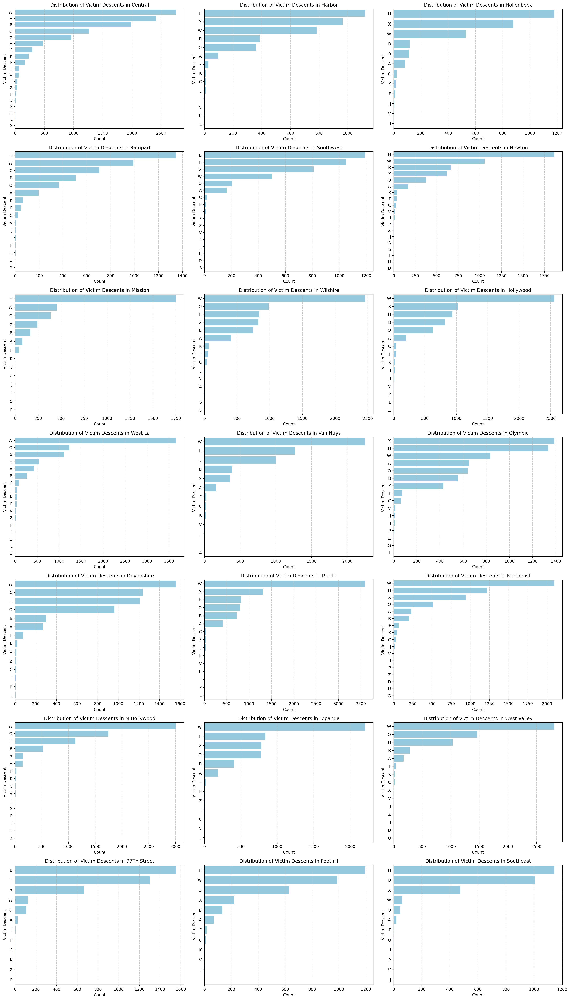

In [171]:
import math
# Get unique areas
areas = burglary_df1['AREA NAME'].unique()

# Determine the number of rows and columns for subplots
num_areas = len(areas)
num_cols = 3  # Number of columns for subplots
num_rows = math.ceil(num_areas / num_cols)  # Calculate the number of rows needed

plt.figure(figsize=(20, num_rows * 5))
for i, area in enumerate(areas, 1):
    plt.subplot(num_rows, num_cols, i)
    subset_df = burglary_df1[burglary_df1['AREA NAME'] == area]
    victim_descent_counts = subset_df['Vict Descent'].value_counts()
    sns.barplot(x=victim_descent_counts.values, y=victim_descent_counts.index, color='skyblue')
    plt.title(f'Distribution of Victim Descents in {area}')
    plt.xlabel('Count')
    plt.ylabel('Victim Descent')
    plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

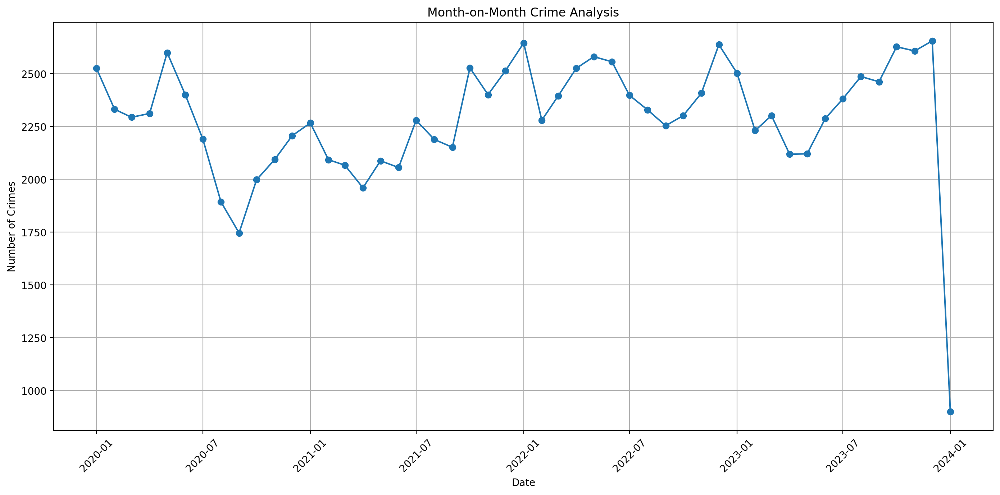

In [172]:
# Grouping by year and month, and count the number of crimes
monthly_crime_counts = burglary_df1.groupby(['Year', 'Month']).size().reset_index(name='Crime Count')

# Creating a datetime column for proper plotting
monthly_crime_counts['Date'] = pd.to_datetime(monthly_crime_counts[['Year', 'Month']].assign(Day=1))

# Plotting the month-on-month crime trend
plt.figure(figsize=(14, 7))
plt.plot(monthly_crime_counts['Date'], monthly_crime_counts['Crime Count'], marker='o')
plt.title('Month-on-Month Crime Analysis')
plt.xlabel('Date')
plt.ylabel('Number of Crimes')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

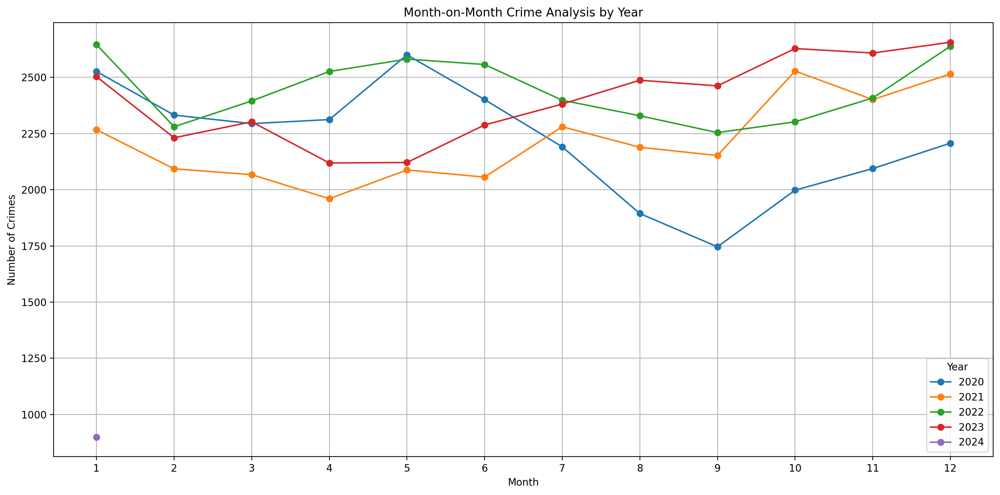

In [173]:
# Group by Year and Month and count the number of crimes
monthly_crime_counts = burglary_df1.groupby(['Year', 'Month']).size().reset_index(name='Crime Count')

# Pivot the data to have years as columns and months as rows
pivot_df = monthly_crime_counts.pivot(index='Month', columns='Year', values='Crime Count')

# Plotting the month-on-month crime trend by year
plt.figure(figsize=(14, 7))
for year in pivot_df.columns:
    plt.plot(pivot_df.index, pivot_df[year], marker='o', label=str(year))

plt.title('Month-on-Month Crime Analysis by Year')
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.legend(title='Year')
plt.grid(True)
plt.xticks(range(1, 13))
plt.tight_layout()
plt.show()

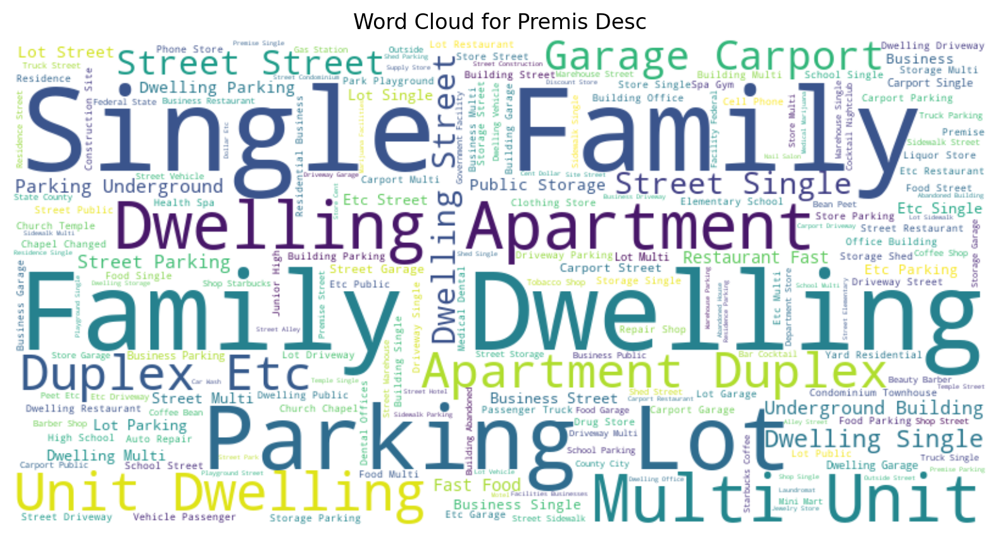

In [174]:
from wordcloud import WordCloud

# Joining all the premises descriptions into a single string
text = ' '.join(burglary_df1['Premis Desc'].dropna().astype(str).tolist())

# Generatuing the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Plotting the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Premis Desc')
plt.show()

In [175]:
burglary_df1

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Status,Status Desc,LOCATION,LAT,LON,Datetime OCC,Day of Week,Month,Hour,Year,Hour Category,Month Category,Day Category
9,200100509,2020-01-04,2020-01-04,2200,1,Central,192,1,330,Burglary From Vehicle,1822 1414 0344 1307,29,M,A,101.0,Street,Ic,Invest Cont,15Th,34.0359,-118.2648,2020-01-04 22:00:00,5,1,22,2020,Evening (6 PM - Midnight),Winter,Weekend
21,200100559,2020-01-23,2020-01-23,0600,1,Central,111,1,310,Burglary,1402 1822 1414 0344,51,M,W,503.0,Hotel,Ao,Adult Other,700 N Main St,34.0583,-118.2378,2020-01-23 06:00:00,3,1,6,2020,Morning (6 AM - Noon),Winter,Weekday
26,200100576,2020-01-30,2020-01-30,0055,1,Central,195,1,330,Burglary From Vehicle,0344 1605 1611 1822 0385 0321,24,M,H,101.0,Street,Aa,Adult Arrest,18Th St,34.0317,-118.2626,2020-01-30 00:55:00,3,1,0,2020,Late Night (Midnight - 6 AM),Winter,Weekday
39,200104035,2020-01-01,2020-01-01,0230,1,Central,111,1,310,Burglary,0344 1822 1414 1605,34,F,B,502.0,"Multi-Unit Dwelling (Apartment, Duplex, Etc)",Ic,Invest Cont,700 Yale St,34.0612,-118.2417,2020-01-01 02:30:00,2,1,2,2020,Late Night (Midnight - 6 AM),Winter,Weekday
56,200104069,2020-01-02,2020-01-02,0545,1,Central,111,1,310,Burglary,1822 1414 0344 1609,0,X,X,210.0,Restaurant/Fast Food,Ic,Invest Cont,800 N Broadway,34.0623,-118.2383,2020-01-02 05:45:00,3,1,5,2020,Late Night (Midnight - 6 AM),Winter,Weekday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
879065,240204642,2024-01-13,2024-01-10,1800,2,Rampart,238,1,310,Burglary,1607 0344,71,F,H,501.0,Single Family Dwelling,Ic,Invest Cont,1300 Colton St,34.0630,-118.2566,2024-01-10 18:00:00,2,1,18,2024,Evening (6 PM - Midnight),Winter,Weekday
879067,240904121,2024-01-04,2024-01-03,2046,9,Van Nuys,946,1,310,Burglary,0344 1609 0358 0321 1420 1414,33,M,W,501.0,Single Family Dwelling,Ic,Invest Cont,5500 Mammoth Av,34.1703,-118.4323,2024-01-03 20:46:00,2,1,20,2024,Evening (6 PM - Midnight),Winter,Weekday
879078,240204648,2024-01-14,2024-01-13,0637,2,Rampart,205,1,330,Burglary From Vehicle,1300 1822 0344 1609 1307 0329,39,M,W,101.0,Street,Ic,Invest Cont,Marathon,34.0807,-118.2753,2024-01-13 06:37:00,5,1,6,2024,Morning (6 AM - Noon),Winter,Weekend
879082,241704452,2024-01-10,2024-01-10,1020,17,Devonshire,1776,1,330,Burglary From Vehicle,0344 1202,60,M,W,501.0,Single Family Dwelling,Ic,Invest Cont,9500 Gerald Av,34.2430,-118.4949,2024-01-10 10:20:00,2,1,10,2024,Morning (6 AM - Noon),Winter,Weekday


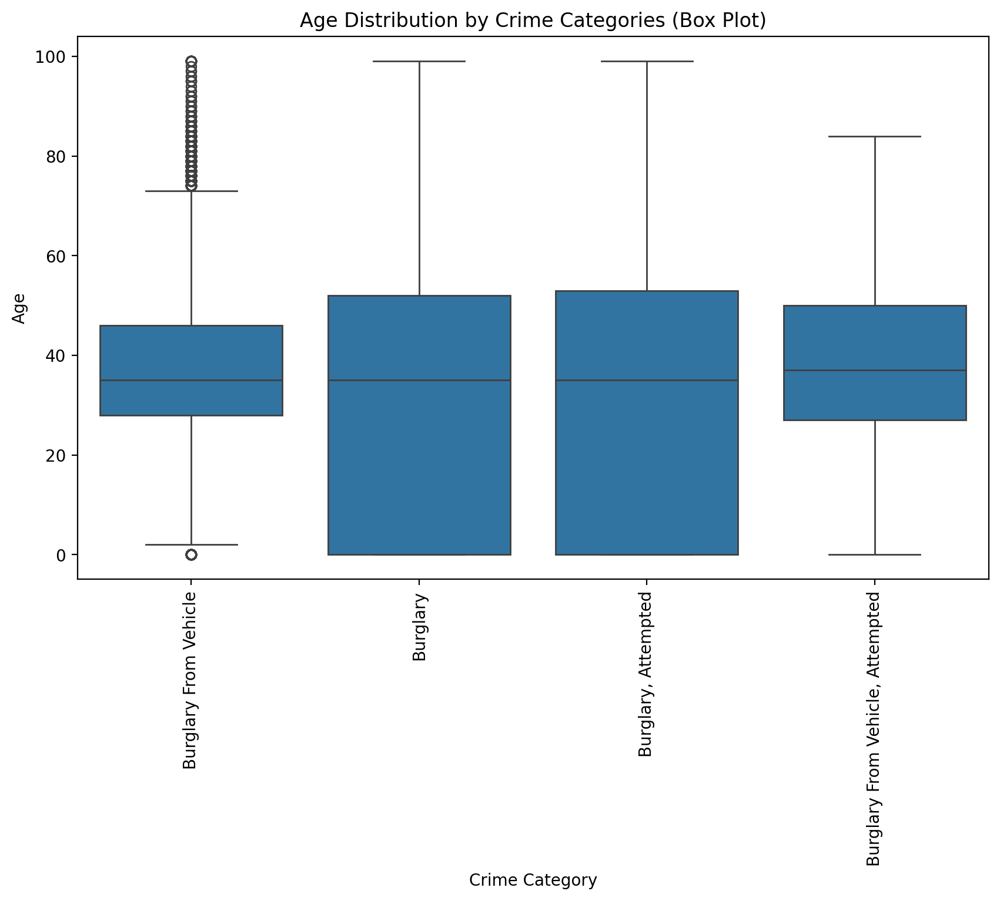

In [176]:
# Plotting a boxplot to check for outliers
plt.figure(figsize=(10, 6))
sns.boxplot(x='Crm Cd Desc', y='Vict Age', data=burglary_df1)
plt.title('Age Distribution by Crime Categories (Box Plot)')
plt.xlabel('Crime Category')
plt.ylabel('Age')
plt.xticks(rotation=90)
plt.show()

In [177]:
%config InlineBackend.figure_format = 'retina'
pd.set_option('display.max_columns', None) 

In [178]:
# Grouping data by area and calculating the mean(latitude & longitude) for each area and counts per area
district_crime_counts = burglary_df1.groupby('AREA NAME').agg(
    latitude=('LAT', 'mean'), longitude=('LON', 'mean'), counts=('AREA NAME', 'size')
).reset_index()

# Map Plotting
fig = px.scatter_mapbox(district_crime_counts,
                        lat="latitude",
                        lon="longitude",
                        size="counts",
                        color="counts",
                        hover_name="AREA NAME",
                        color_continuous_scale="jet",
                        hover_data=["counts", "latitude", "longitude"],
                        zoom=9,
                        height=750, width=1200,
                        title="Map of Crime Counts by District")
fig.update_layout(mapbox_style="open-street-map")
fig.show()


In [179]:
# Filtering the dataframe for rows within a 2 years
start_date = '2020-01-01'
end_date = '2024-01-31'
mask = (burglary_df1['Datetime OCC'] >= pd.to_datetime(start_date)) & (burglary_df1['Datetime OCC'] <= pd.to_datetime(end_date))
data_filtered_month = burglary_df1.loc[mask]

if data_filtered_month.empty:
    raise ValueError("No data available for the specified date range.")

# Filtering out any rows where 'latitude' or 'longitude' might be NaN
data_filtered_month = data_filtered_month.dropna(subset=['LAT', 'LON'])

if data_filtered_month.empty:
    raise ValueError("No data available after removing rows with NaN in latitude/longitude.")

# Counting occurrences in the AREA NAME column
crime_counts = data_filtered_month['AREA NAME'].value_counts()

high_threshold = crime_counts.quantile(0.67)
medium_threshold = crime_counts.quantile(0.33)

data_filtered_month['crime_frequency'] = data_filtered_month['AREA NAME'].apply(
    lambda name: 'high' if crime_counts[name] >= high_threshold
    else 'medium' if crime_counts[name] >= medium_threshold else 'low'
)

# Calculating the mean of the coordinates for the central location
location_central = [
    data_filtered_month['LAT'].mean(),
    data_filtered_month['LON'].mean()
]

# Creating the map with the central location
m = folium.Map(location=location_central, zoom_start=12)

# Function to determine color based on crime frequency
def get_color(frequency):
    if frequency == 'high':
        return 'red'
    elif frequency == 'medium':
        return 'orange'
    else:
        return 'green'

# Adding markers to the map
for name, group in data_filtered_month.groupby('AREA NAME'):
    coords = group[['LAT', 'LON']].mean().values.tolist()
    crime_frequency = group['crime_frequency'].iloc[0]

    folium.Circle(
        location=coords,
        radius=700,
        color=get_color(crime_frequency),
        fill=True,
        fill_color=get_color(crime_frequency)
    ).add_to(m)
# Creating a colour legend with adjusted position and size
legend_html = """
     <div style="position: fixed; 
     bottom: 10px; left: 10px; width: 120px; 
     border:2px solid grey; z-index:9999; font-size:12px;
     background-color: white; padding: 8px">
     &nbsp; <strong>Based on frequency</strong> <br>
     &nbsp; High Crimes &nbsp; <i class="fa fa-circle" style="color:red"></i><br>
     &nbsp; Med Crimes &nbsp; <i class="fa fa-circle" style="color:orange"></i><br>
     &nbsp; Low Crimes &nbsp; <i class="fa fa-circle" style="color:green"></i>
     </div>
     """

# Adding the color legend to the map
m.get_root().html.add_child(folium.Element(legend_html))

# Displaying the map
m

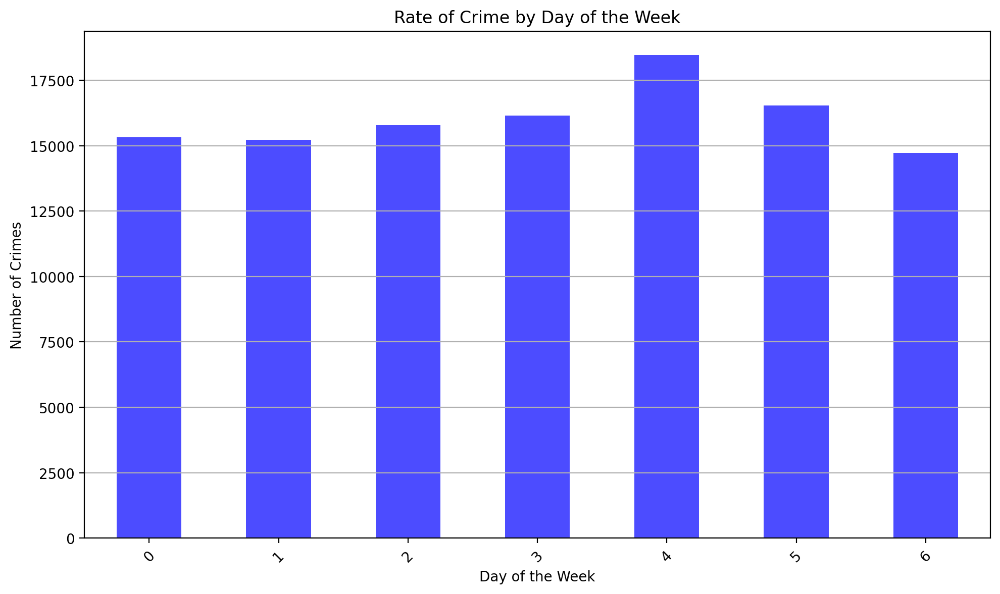

In [180]:
# Grouping by the day of week and calculating the average number of crimes
day_of_week_crime_counts = burglary_df1['Day of Week'].value_counts().sort_index()

# Ordering days of the week correctly
ordered_days = [0, 1, 2, 3, 4, 5, 6]
day_of_week_crime_counts = day_of_week_crime_counts.reindex(ordered_days)

# Plotting the rate of crime per day of the week
plt.figure(figsize=(10, 6))
day_of_week_crime_counts.plot(kind='bar', color='b', alpha=0.7)
plt.title('Rate of Crime by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Crimes')
plt.grid(axis='y')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

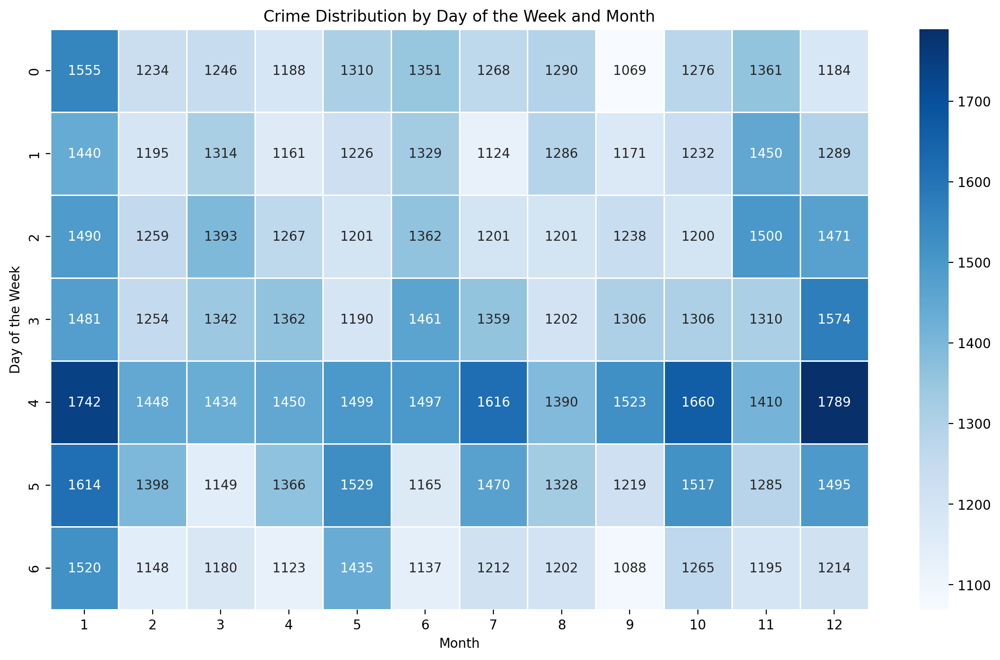

In [181]:
# Creating a pivot table with days of the week as rows and months as columns
pivot_table = burglary_df1.pivot_table(index='Day of Week', columns='Month', aggfunc='size', fill_value=0)

# Ordering days of the week correctly
ordered_days = [0, 1, 2, 3, 4, 5, 6]
pivot_table = pivot_table.reindex(ordered_days)

# Ordering months correctly
ordered_months = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
pivot_table = pivot_table[ordered_months]

# Plotting the heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='Blues', linewidths=.5)
plt.title('Crime Distribution by Day of the Week and Month')
plt.xlabel('Month')
plt.ylabel('Day of the Week')
plt.show()


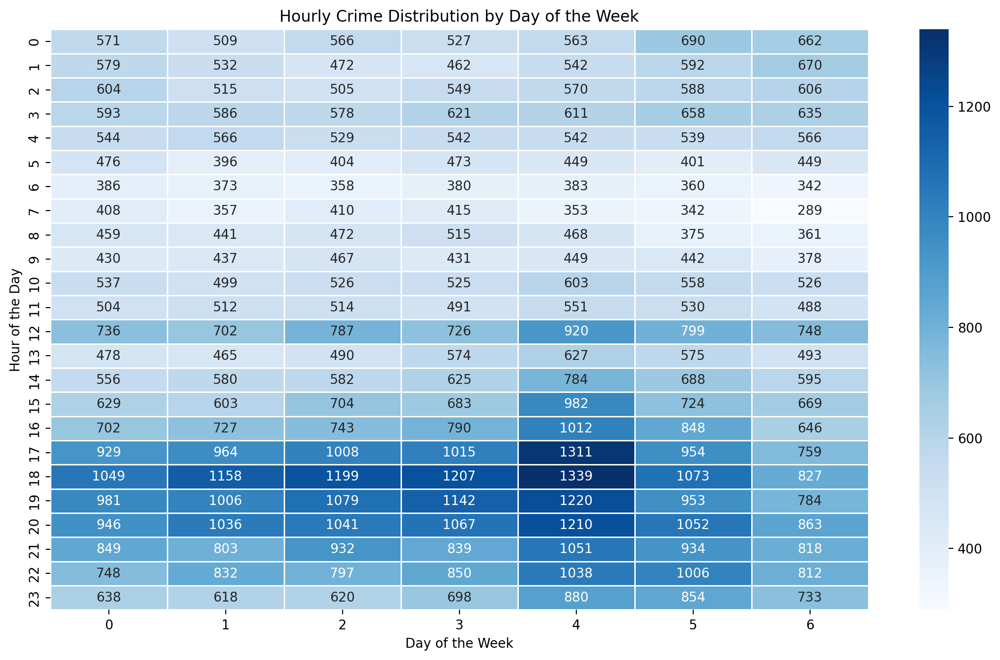

In [182]:
# Creating a pivot table with hours as rows and days of the week as columns
pivot_table = burglary_df1.pivot_table(index='Hour', columns='Day of Week', aggfunc='size', fill_value=0)

# Ordering days of the week correctly
ordered_days = [0, 1, 2, 3, 4, 5, 6]
pivot_table = pivot_table[ordered_days]

# Plotting the heatmap
plt.figure(figsize=(14, 8))
sns.heatmap(pivot_table, annot=True, fmt='d', cmap='Blues', linewidths=.5)
plt.title('Hourly Crime Distribution by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Hour of the Day')
plt.show()

<Figure size 1500x1000 with 0 Axes>

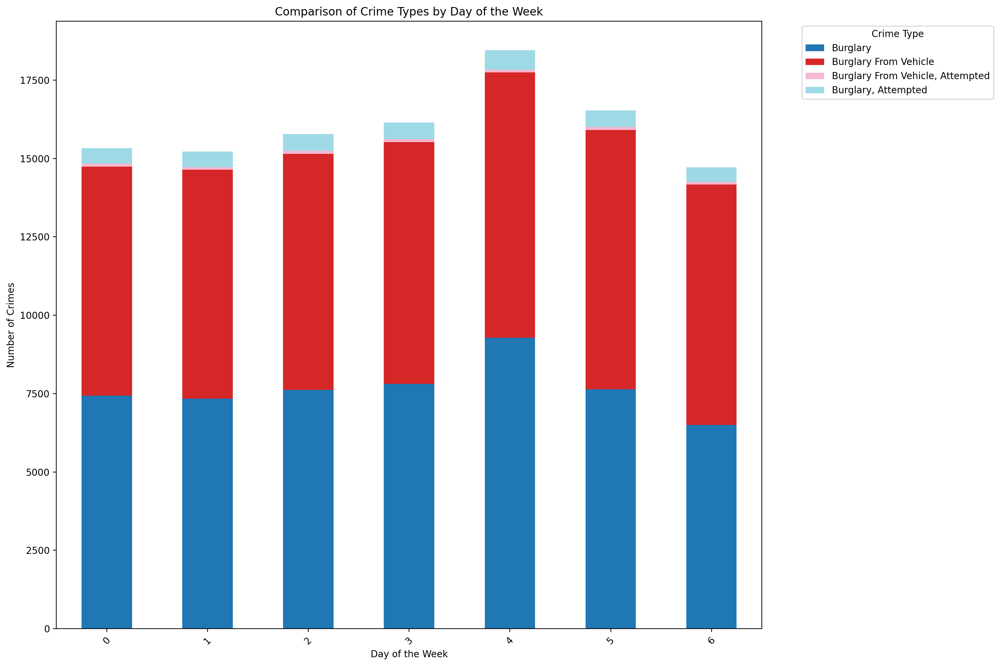

In [183]:
# Grouping by the day of week, the crime code and count occurrences
crime_by_day = burglary_df1.groupby(['Day of Week', 'Crm Cd Desc']).size().unstack(fill_value=0)

# Ordering days of the week correctly
ordered_days = [0, 1, 2, 3, 4, 5, 6]
crime_by_day = crime_by_day.reindex(ordered_days)

# Plotting the data
plt.figure(figsize=(15, 10))
crime_by_day.plot(kind='bar', stacked=True, colormap='tab20', figsize=(15, 10))

plt.title('Comparison of Crime Types by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Crimes')
plt.legend(title='Crime Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

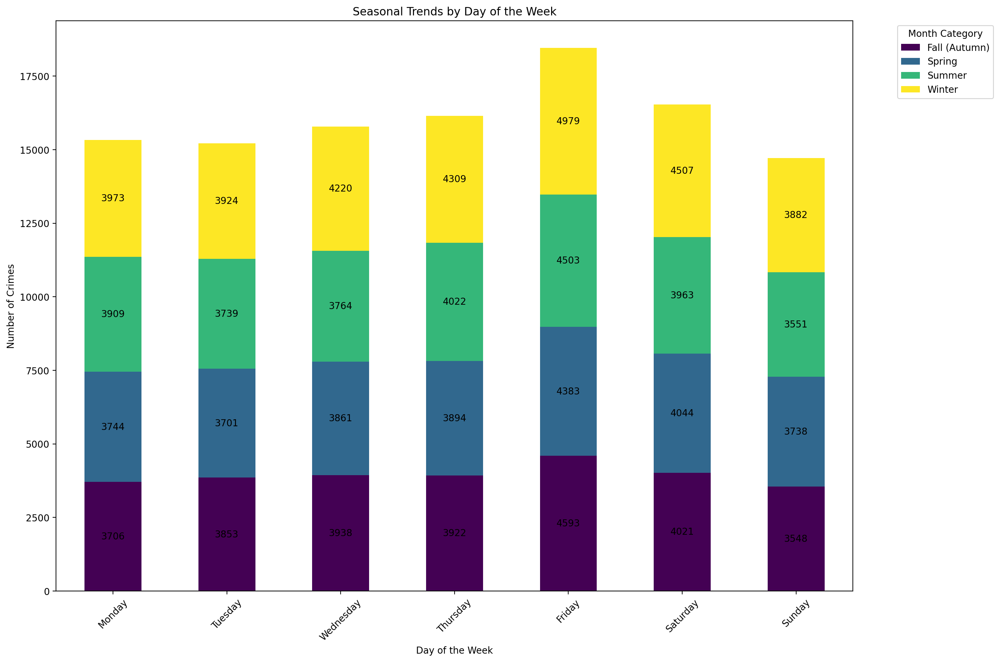

In [184]:
# Grouping by day of the week, month category and count occurrences
seasonal_trends = burglary_df1.groupby(['Day of Week', 'Month Category']).size().unstack(fill_value=0)

# Ordering days of the week correctly
ordered_days = [0, 1, 2, 3, 4, 5, 6]
seasonal_trends = seasonal_trends.reindex(ordered_days)

# Plotting the data
ax = seasonal_trends.plot(kind='bar', stacked=True, colormap='viridis', figsize=(15, 10))

# Annotatting bars with counts
for container in ax.containers:
    ax.bar_label(container, label_type='center')

# Customising the plot
plt.title('Seasonal Trends by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Crimes')
plt.legend(title='Month Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=range(len(seasonal_trends.index)), labels=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], rotation=45)
plt.tight_layout()

# Show plot
plt.show()

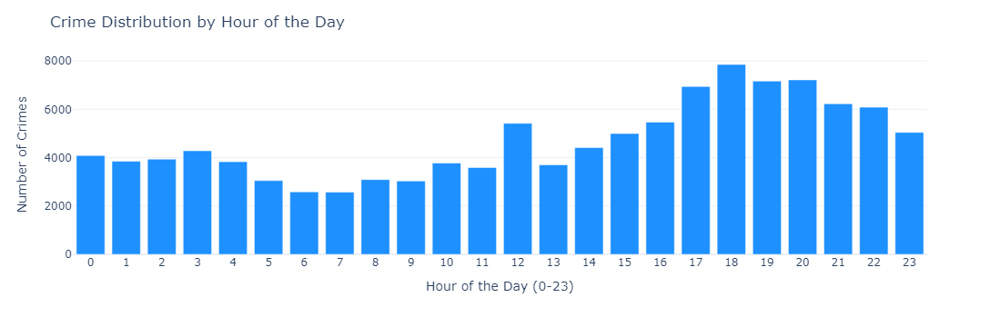

In [185]:
# Counting crimes by each hour of the day
hourly_crime_counts = burglary_df1['Hour'].value_counts().sort_index()

# Plotting the distribution of crimes by hour
fig = px.bar(x=hourly_crime_counts.index, y=hourly_crime_counts.values, labels={'x': 'Hour of the Day (0-23)', 'y': 'Number of Crimes'}, color_discrete_sequence=['dodgerblue'])

# Updating layout for the plot
fig.update_layout(
    title='Crime Distribution by Hour of the Day',
    template='plotly_white',
    showlegend=False
)

fig.update_xaxes(
    tickmode='array',
    tickvals=list(range(24)), 
    ticktext=[str(hour) for hour in range(24)]  
)

# Display the plot
fig.show()


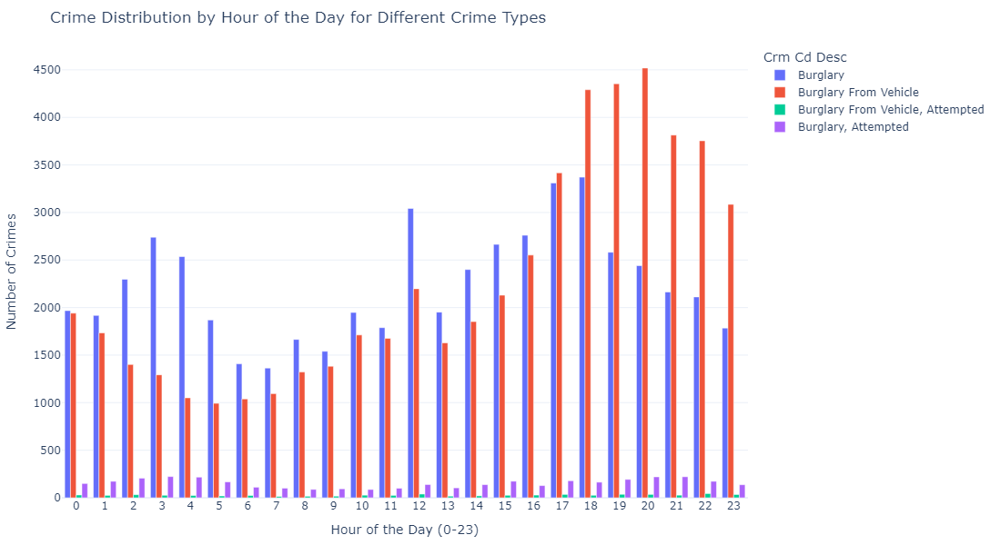

In [186]:
# Grouping data by crime type and hour
crime_hourly_counts = burglary_df1.groupby(['Crm Cd Desc', 'Hour']).size().reset_index(name='Count')

# Plotting the distribution of crimes by hour for each crime type in a single grouped bar chart
fig = px.bar(crime_hourly_counts, x='Hour', y='Count', color='Crm Cd Desc',
             labels={'Hour': 'Hour of the Day (0-23)', 'Count': 'Number of Crimes'},
             title='Crime Distribution by Hour of the Day for Different Crime Types',
             barmode='group',  # Group the bars for different crime types
             category_orders={"Hour": list(range(24))})

fig.update_layout(
    template='plotly_white',
    height=600,  # Adjust the height as needed
    margin=dict(l=20, r=20, t=50, b=20)  # Adjust margins
)

fig.update_xaxes(
    tickmode='array',
    tickvals=list(range(24)),
    ticktext=[str(hour) for hour in range(24)]
)

fig.show()

# CrimeSolver Analysis

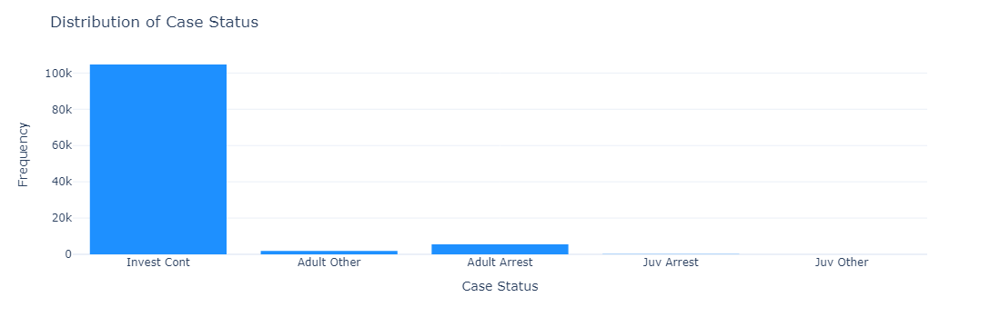

In [187]:
# Creating a histogram for the distribution of the case status
fig = px.histogram(burglary_df1, x='Status Desc', color_discrete_sequence=['dodgerblue'])

# Updating layout for the plot
fig.update_layout(
    title='Distribution of Case Status',
    xaxis_title='Case Status',
    yaxis_title='Frequency',
    bargap=0.2,
    template='plotly_white'
)

fig.show()

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\3929710833.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



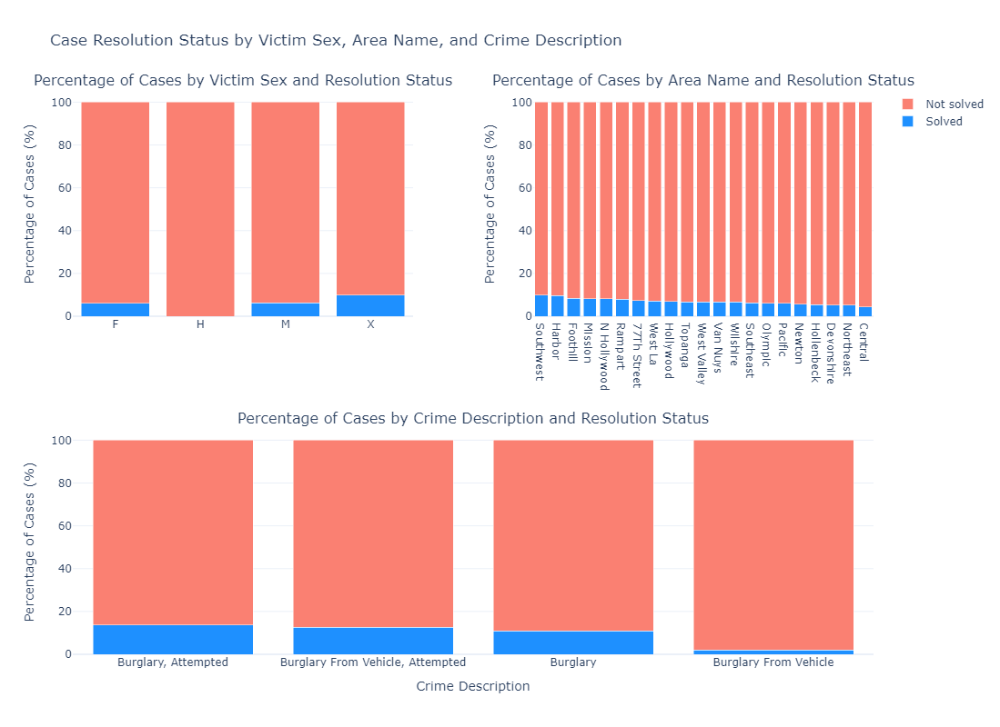

In [189]:
# Adding case solved column
burglary_df1['case_solved'] = burglary_df1['Status Desc'].apply(lambda x: 'Not solved' if x == 'Invest Cont' else 'Solved')

# Data preparation for the victim sex plot
sex_solved_counts = burglary_df1.groupby(['Vict Sex', 'case_solved']).size().unstack()
sex_solved_percent = sex_solved_counts.div(sex_solved_counts.sum(axis=1), axis=0) * 100

# Data preparation for the crime description plot
crime_solved_counts = burglary_df1.groupby(['Crm Cd Desc', 'case_solved']).size().unstack()
crime_solved_percent = crime_solved_counts.div(crime_solved_counts.sum(axis=1), axis=0) * 100
crime_solved_percent_sorted = crime_solved_percent.sort_values(by='Solved', ascending=False)

# Data preparation for area_name plot
area_solved_counts = burglary_df1.groupby(['AREA NAME', 'case_solved']).size().unstack()
area_solved_percent = area_solved_counts.div(area_solved_counts.sum(axis=1), axis=0) * 100
area_solved_percent_sorted = area_solved_percent.sort_values(by='Solved', ascending=False)

fig = make_subplots(
    rows=2, cols=2, 
    subplot_titles=('Percentage of Cases by Victim Sex and Resolution Status', 
                    'Percentage of Cases by Area Name and Resolution Status',
                    'Percentage of Cases by Crime Description and Resolution Status'),
    specs=[[{"type": "bar"}, {"type": "bar"}], 
           [{"type": "bar", "colspan": 2}, None]],
    horizontal_spacing=0.15, vertical_spacing=0.2
)

# Plot for victim sex
fig.add_trace(
    go.Bar(x=sex_solved_percent.index, y=sex_solved_percent['Solved'], name='Solved', marker_color='dodgerblue'),
    row=1, col=1
)
fig.add_trace(
    go.Bar(x=sex_solved_percent.index, y=sex_solved_percent['Not solved'], name='Not solved', marker_color='salmon'),
    row=1, col=1
)

# Plotting for the area name
fig.add_trace(
    go.Bar(x=area_solved_percent_sorted.index, y=area_solved_percent_sorted['Solved'], name='Solved', marker_color='dodgerblue', showlegend=False),
    row=1, col=2
)
fig.add_trace(
    go.Bar(x=area_solved_percent_sorted.index, y=area_solved_percent_sorted['Not solved'], name='Not solved', marker_color='salmon', showlegend=False),
    row=1, col=2
)

# Plotting for the crime description
fig.add_trace(
    go.Bar(x=crime_solved_percent_sorted.index, y=crime_solved_percent_sorted['Solved'], name='Solved', marker_color='dodgerblue', showlegend=False),
    row=2, col=1
)
fig.add_trace(
    go.Bar(x=crime_solved_percent_sorted.index, y=crime_solved_percent_sorted['Not solved'], name='Not solved', marker_color='salmon', showlegend=False),
    row=2, col=1
)

# Updating the layout for the charts
fig.update_layout(
    height=800, 
    barmode='stack',
    title_text="Case Resolution Status by Victim Sex, Area Name, and Crime Description",
    template='plotly_white'
)

# Updating the y-axis based titles
fig.update_yaxes(title_text="Percentage of Cases (%)", row=1, col=1)
fig.update_yaxes(title_text="Percentage of Cases (%)", row=1, col=2)
fig.update_yaxes(title_text="Percentage of Cases (%)", row=2, col=1)

# Ensuring the x-axis labels are shown for the crime description plot
fig.update_xaxes(title_text="Crime Description", showticklabels=True, row=2, col=1)

fig.show()

In [190]:
burglary_df1

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Status,Status Desc,LOCATION,LAT,LON,Datetime OCC,Day of Week,Month,Hour,Year,Hour Category,Month Category,Day Category,case_solved
9,200100509,2020-01-04,2020-01-04,2200,1,Central,192,1,330,Burglary From Vehicle,1822 1414 0344 1307,29,M,A,101.0,Street,Ic,Invest Cont,15Th,34.0359,-118.2648,2020-01-04 22:00:00,5,1,22,2020,Evening (6 PM - Midnight),Winter,Weekend,Not solved
21,200100559,2020-01-23,2020-01-23,0600,1,Central,111,1,310,Burglary,1402 1822 1414 0344,51,M,W,503.0,Hotel,Ao,Adult Other,700 N Main St,34.0583,-118.2378,2020-01-23 06:00:00,3,1,6,2020,Morning (6 AM - Noon),Winter,Weekday,Solved
26,200100576,2020-01-30,2020-01-30,0055,1,Central,195,1,330,Burglary From Vehicle,0344 1605 1611 1822 0385 0321,24,M,H,101.0,Street,Aa,Adult Arrest,18Th St,34.0317,-118.2626,2020-01-30 00:55:00,3,1,0,2020,Late Night (Midnight - 6 AM),Winter,Weekday,Solved
39,200104035,2020-01-01,2020-01-01,0230,1,Central,111,1,310,Burglary,0344 1822 1414 1605,34,F,B,502.0,"Multi-Unit Dwelling (Apartment, Duplex, Etc)",Ic,Invest Cont,700 Yale St,34.0612,-118.2417,2020-01-01 02:30:00,2,1,2,2020,Late Night (Midnight - 6 AM),Winter,Weekday,Not solved
56,200104069,2020-01-02,2020-01-02,0545,1,Central,111,1,310,Burglary,1822 1414 0344 1609,0,X,X,210.0,Restaurant/Fast Food,Ic,Invest Cont,800 N Broadway,34.0623,-118.2383,2020-01-02 05:45:00,3,1,5,2020,Late Night (Midnight - 6 AM),Winter,Weekday,Not solved
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
879065,240204642,2024-01-13,2024-01-10,1800,2,Rampart,238,1,310,Burglary,1607 0344,71,F,H,501.0,Single Family Dwelling,Ic,Invest Cont,1300 Colton St,34.0630,-118.2566,2024-01-10 18:00:00,2,1,18,2024,Evening (6 PM - Midnight),Winter,Weekday,Not solved
879067,240904121,2024-01-04,2024-01-03,2046,9,Van Nuys,946,1,310,Burglary,0344 1609 0358 0321 1420 1414,33,M,W,501.0,Single Family Dwelling,Ic,Invest Cont,5500 Mammoth Av,34.1703,-118.4323,2024-01-03 20:46:00,2,1,20,2024,Evening (6 PM - Midnight),Winter,Weekday,Not solved
879078,240204648,2024-01-14,2024-01-13,0637,2,Rampart,205,1,330,Burglary From Vehicle,1300 1822 0344 1609 1307 0329,39,M,W,101.0,Street,Ic,Invest Cont,Marathon,34.0807,-118.2753,2024-01-13 06:37:00,5,1,6,2024,Morning (6 AM - Noon),Winter,Weekend,Not solved
879082,241704452,2024-01-10,2024-01-10,1020,17,Devonshire,1776,1,330,Burglary From Vehicle,0344 1202,60,M,W,501.0,Single Family Dwelling,Ic,Invest Cont,9500 Gerald Av,34.2430,-118.4949,2024-01-10 10:20:00,2,1,10,2024,Morning (6 AM - Noon),Winter,Weekday,Not solved


# Machine Learning Model

In [191]:
# Calculating the delay of the report and days after the report
today = datetime.now()
burglary_df1['reported_delay'] = (burglary_df1['Date Rptd'] - burglary_df1['DATE OCC']).dt.days
burglary_df1['reported_delay'] = burglary_df1['reported_delay'].apply(lambda x: x if x >= 0 else 0)
burglary_df1['days_after_reported'] = (today - burglary_df1['Date Rptd']).dt.days

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\1590363879.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\1590363879.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\1590363879.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

In [192]:
# Preparing the target variable and converting it to binary
target = 'case_solved'
le = LabelEncoder()
burglary_df1[target] = le.fit_transform(burglary_df1[target])

# Listing the features for the model
features = ['AREA', 'Crm Cd', 'Vict Sex', 'Vict Descent', 'Hour', 'reported_delay', 'days_after_reported']

# Explicitly converting all categorical features to strings
for feature in ['Vict Sex', 'Vict Descent']:
    burglary_df1[feature] = burglary_df1[feature].astype(str)

# Encoding categorical features
label_encoders = {}
for feature in ['Vict Sex', 'Vict Descent']:
    le = LabelEncoder()
    burglary_df1[feature] = le.fit_transform(burglary_df1[feature])
    label_encoders[feature] = le

# Displaying the first few rows of the data to verify the encoding
burglary_df1[features].head()

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\1967956016.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\1967956016.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\rafek\AppData\Local\Temp\ipykernel_10312\1967956016.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

,AREA,Crm Cd,Vict Sex,Vict Descent,Hour,reported_delay,days_after_reported
9,1,330,2,0,22,0,1615
21,1,310,2,16,6,0,1596
26,1,330,2,6,0,0,1589
39,1,310,0,1,2,0,1618
56,1,310,3,17,5,0,1617


In [193]:
# Preparing the data
X = burglary_df1[features]  # Features
y = burglary_df1[target]    # Target

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardising the features (important for logistic regression)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Logistic Regression Model
log_reg = LogisticRegression()
log_reg.fit(X_train_scaled, y_train)

# Random Forest Classifier Model
rf_clf = RandomForestClassifier()
rf_clf.fit(X_train, y_train)

# Making predictions and evaluating the models
log_reg_pred = log_reg.predict(X_test_scaled)
rf_clf_pred = rf_clf.predict(X_test)

print("Logistic Regression Accuracy:", accuracy_score(y_test, log_reg_pred))
print("Random Forest Classifier Accuracy:", accuracy_score(y_test, rf_clf_pred))

# Displaying the classification reports for a more detailed performance analysis
print("\nLogistic Regression Classification Report:\n", classification_report(y_test, log_reg_pred))
print("\nRandom Forest Classifier Classification Report:\n", classification_report(y_test, rf_clf_pred))

Logistic Regression Accuracy: 0.9336561887218492
Random Forest Classifier Accuracy: 0.9284568304712104

Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.93      1.00      0.97     31425
           1       0.00      0.00      0.00      2233

    accuracy                           0.93     33658
   macro avg       0.47      0.50      0.48     33658
weighted avg       0.87      0.93      0.90     33658


Random Forest Classifier Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96     31425
           1       0.30      0.06      0.10      2233

    accuracy                           0.93     33658
   macro avg       0.62      0.52      0.53     33658
weighted avg       0.89      0.93      0.91     33658



C:\Users\rafek\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\rafek\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\rafek\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

